In [1]:
from vizsequence import viz_sequence
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

In [2]:
%cd ../data/gkmexplain-ibd

/Volumes/Private/Ciofani Lab/NGS_Data/projects/human-th-ms/data/gkmexplain-ibd


In [3]:
from Bio import SeqIO
from Bio import Seq

In [4]:
def oneHot(seq):
    mappings = {"A" : [1,0,0,0],
               "C" : [0,1,0,0],
               "G" : [0,0,1,0],
               "T" : [0,0,0,1]}
    
    result = []
    
    for letter in seq:
        result.append(mappings[letter])
    
    return(np.array(result))

## Retrieve and organize the LD-expanded SNPs

In [5]:
snp_info = pd.read_table("../snp_data/ld_expansion_ibd/ld_snps_info.tab")

In [6]:
snp_info = snp_info.drop_duplicates(['snp_id'])
snp_info = snp_info.drop(columns=['query', 'r2', 'd_prime', 'synonyms', 'result'])
snp_info = snp_info.rename(columns={'snp_id' : 'rsid'}).set_index('rsid')
snp_info.head()

,MAF,minor_allele,consequence,allele_string,chrom,start,end
rsid,,,,,,,
rs268124,0.3097,C,intron_variant,C/G/T,chr2,65427230,65427230
rs8071537,0.3800,T,intron_variant,G/T,chr17,42378877,42378877
rs8073517,0.4872,T,intron_variant,T/A/C,chr17,42351306,42351306
rs35840966,0.3920,T,intron_variant,C/T,chr17,42369186,42369186
rs12949918,0.3978,C,intron_variant,T/C,chr17,42374255,42374255


In [7]:
# Get the ref and alternate alleles
snp_info['ref_allele'] = snp_info.loc[:,"allele_string"].str.split("/", expand=True)[0]
snp_info['alt_allele'] = snp_info.loc[:,"allele_string"].str.split("/", expand=True)[1]
snp_info.head()

,MAF,minor_allele,consequence,allele_string,chrom,start,end,ref_allele,alt_allele
rsid,,,,,,,,,
rs268124,0.3097,C,intron_variant,C/G/T,chr2,65427230,65427230,C,G
rs8071537,0.3800,T,intron_variant,G/T,chr17,42378877,42378877,G,T
rs8073517,0.4872,T,intron_variant,T/A/C,chr17,42351306,42351306,T,A
rs35840966,0.3920,T,intron_variant,C/T,chr17,42369186,42369186,C,T
rs12949918,0.3978,C,intron_variant,T/C,chr17,42374255,42374255,T,C


In [8]:
# Filter indels
snp_info['snv'] = snp_info.ref_allele.isin(['A','C', 'G', 'T']) & snp_info.alt_allele.isin(['A','C', 'G', 'T'])
snp_info.head()

,MAF,minor_allele,consequence,allele_string,chrom,start,end,ref_allele,alt_allele,snv
rsid,,,,,,,,,,
rs268124,0.3097,C,intron_variant,C/G/T,chr2,65427230,65427230,C,G,True
rs8071537,0.3800,T,intron_variant,G/T,chr17,42378877,42378877,G,T,True
rs8073517,0.4872,T,intron_variant,T/A/C,chr17,42351306,42351306,T,A,True
rs35840966,0.3920,T,intron_variant,C/T,chr17,42369186,42369186,C,T,True
rs12949918,0.3978,C,intron_variant,T/C,chr17,42374255,42374255,T,C,True


## Generate FASTA sequences with 25bp flanks

In [9]:
# Generate a BED file to extract sequences with
snv_bed = snp_info[snp_info.snv].reset_index()[['chrom', 'start', 'end', 'rsid']]
snv_bed['start'] = snv_bed['start'] - 26
snv_bed['end'] = snv_bed['end'] + 25
snv_bed[['start', 'end']] = snv_bed[['start', 'end']].astype(int)
snv_bed.to_csv("snv_51bp_ref.bed", header=None, index=None, sep="\t")

In [14]:
%%bash
bedtools getfasta -name -fi ../gkmexplain-ms/GRCh38.primary_assembly.genome.fa -bed snv_51bp_ref.bed > snp_51bp_ref.fa

In [10]:
snp = list(SeqIO.parse("snp_51bp_ref.fa", format="fasta"))

snp_1h_name = [[oneHot(record.seq), record.name] for record in snp]

In [11]:
ref_seqs = pd.DataFrame([(rec.name, str(rec.seq)) for rec in snp], 
                       columns=['rsid', 'ref']).drop_duplicates(['rsid']).set_index("rsid")
ref_seqs.head()

,ref
rsid,
rs268124,GGGACTACAGGTGTGCGCTACCACACGCGGCTAATTTTTATTTTTT...
rs8071537,TGTCAGAAAAAGTGTTTGCTAAAAAGCAAAACAAAATGAACATGAG...
rs8073517,TGTCACCCAGGCTGGAGTGCAGTGGTTCAATCACAGCTCACTGTAG...
rs35840966,CAGCCTGCCCAACACGGTGAAACCCCATCTCTACTAGAAATACAAA...
rs12949918,CTTAGAGAGAATCTAGAAAGAAACATTATCCAGTTTGTGTTGGGGA...


In [12]:
snp_info = snp_info.drop(columns=['chrom', 'start', 'end'])

In [13]:
snp_combined = ref_seqs.merge(snp_info, left_index=True, right_index=True)

In [14]:
snp_combined.shape

(13970, 8)

### Generate alternate alleles
This helps to verify our coordinates were set correctly and is necessary later for visualizing base-wise gkmexplain importance scores to see how SNPs disrupt TF motifs.

In [15]:
def generateAltAllele(row):
    ref_seq = row['ref']
    alt_bases = row['alt_allele']
    if alt_bases == '-':
        alt_bases = ""
    alt_seq = ref_seq[:25] + alt_bases + ref_seq[26:]
    return alt_seq

In [16]:
snp_combined['alt'] = snp_combined.apply(generateAltAllele, axis=1)

In [17]:
snp_combined['alt'].apply(len)

rsid
rs268124      51
rs8071537     51
rs8073517     51
rs35840966    51
rs12949918    51
              ..
rs1292053     51
rs2073505     51
rs10045431    51
rs929351      51
rs694739      51
Name: alt, Length: 13970, dtype: int64

In [18]:
# Write the alternate alleles to a fasta file
fh_alt = open("snp_51bp_alt.fa", "w")
for ix, row in snp_combined.iterrows():
    fh_alt.write(">" + ix + "-alt" + "\n")
    fh_alt.write(row['alt'] + "\n")
fh_alt.close()

Now we need to **proceed to gkmexplain scoring** by moving the ref and alt allele FASTA files to the cluster, and running gkmexplain.

`rsync -avz snp_51bp_*.fa jdw54@dcc-slogin.oit.duke.edu:~/projects/human-th-ms/data/gkmexplain-ibd/`

## Analyze gkmexplain results

When it's done, bring it back: `rsync -avz jdw54@dcc-slogin.oit.duke.edu:~/projects/human-th-ms/data/gkmexplain-ibd/ ./ `

In [19]:
import os
import re

In [20]:
scorefiles = [x for x in os.listdir() if x.endswith(".gkmexplain")]
name_re = re.compile(r"snp_51bp_ref.fa.(Th\d+_[A-Za-z]+)_.*")
re.search(name_re, scorefiles[1]).group(1)

'Th17_Std'

In [21]:
def extractPtbForAlt(row, file):
    '''Given a row in the table below, extracts the perturbation score for the alt-allele'''
    try:
        alt = snp_combined['alt_allele'][row['rsid']]
        one_h = 0
        if alt == 'A':
            one_h = 0
        elif alt == 'C':
            one_h = 1
        elif alt == 'G':
            one_h = 2
        elif alt == 'T':
            one_h = 3
        else:
            raise(ValueError("This is not an ACGT base!"))
        return row[file].split(",")[one_h]
    except:
        return np.nan

In [22]:
# # This loop reads in the files, reformats, and extracts the perturbation score of interest
# tables = []
# name_re = re.compile(r"ibd_snps_(Th\d+_[A-Za-z]+)_.*")
# for ix, file in enumerate(scorefiles):
#     name = re.search(name_re, file).group(1)
#     begin = pd.read_table(file, header=None)
#     begin.columns = ("rsid", "base_score", name)
#     begin[name] = begin.apply(lambda x: extractPtbForAlt(x, name), axis=1)
#     if ix == 0:
#         begin.set_index('rsid')
#     else:
#         begin.drop(columns=['rsid'], inplace=True)
#     begin.drop(columns=['base_score'], inplace=True)
#     tables.append(begin)
    
# all_gkm_scores = pd.concat(tables, axis=1, sort=False).set_index('rsid')
# all_gkm_scores = all_gkm_scores.astype('float64')

In [23]:
# This loop reads in the files, reformats, and extracts the perturbation score of interest
tables = []
name_re = re.compile(r"snp_51bp_ref.fa.(Th\d+_[A-Za-z]+)_.*")
for ix, file in enumerate(scorefiles):
    name = re.search(name_re, file).group(1)
    begin = pd.read_table(file, header=None)
    begin.columns = ("rsid", "base_score", name)
#     begin[["rsid"]] = begin.name.str.split("::", expand=True)
    begin[name] = begin.apply(lambda x: extractPtbForAlt(x, name), axis=1)
    if ix == 0:
        begin.set_index('rsid')
    else:
        begin.drop(columns=['rsid'], inplace=True)
    begin.drop(columns=['base_score'], inplace=True)
    tables.append(begin)
    
all_gkm_scores = pd.concat(tables, axis=1, sort=False).set_index('rsid')
    

In [24]:
all_gkm_scores = all_gkm_scores.astype('float64')
all_gkm_scores.head()

,Th17_CC,Th17_Std,Th1_Std,Th1_CC
rsid,,,,
rs268124,-0.001942,0.035221,0.108527,0.058822
rs8071537,-0.315468,-0.192369,-0.113665,-0.111151
rs8073517,-0.314864,-0.267639,-0.040225,-0.227285
rs35840966,-0.029515,-0.090065,-0.100393,-0.068342
rs12949918,0.056283,0.152486,0.066835,0.007150


In [25]:
snp_51_per = all_gkm_scores.merge(snp_combined[['ref_allele', 'alt_allele', 'minor_allele']], left_index=True, right_index=True)


In [26]:
snp_51_per.sort_values("Th17_Std").head()

,Th17_CC,Th17_Std,Th1_Std,Th1_CC,ref_allele,alt_allele,minor_allele
rsid,,,,,,,
rs17293632,-0.809833,-1.44324,-1.52507,-0.870657,C,T,T
rs2664280,-0.886334,-1.37068,-1.21816,-0.796789,A,T,T
rs6665749,-0.963454,-1.21052,-1.03652,-0.814092,A,G,G
rs10187822,-1.215960,-1.08766,-1.30151,-1.128120,C,T,T
rs1518369,-0.718704,-1.08755,-1.09032,-0.579466,G,A,A


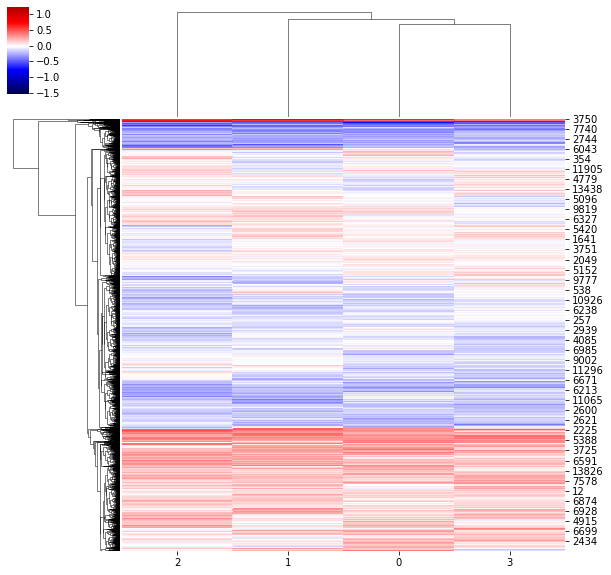

In [27]:
sns.clustermap(snp_51_per.iloc[:,:4].dropna().to_numpy(), cmap="seismic", center=0)

### Bring in looping info

In [28]:
looping = pd.read_table("../snp_data/atac_snp_loop_ibd/all_interactions_with_snp_info.tab")
looping = looping.dropna(subset=['name_snp'])
looping = looping.rename(columns={'name_snp' : 'rsid'})

In [29]:
looping_pert = looping.merge(snp_51_per, left_on='rsid', right_index=True)
looping_pert[['Th17_Std', 'Th1_Std']] = looping_pert[['Th17_Std', 'Th1_Std']].astype('float64')

In [32]:
all_perts = snp_51_per.merge(looping[['rsid', 'name_atac','gene_symbol']], left_index=True, right_on='rsid', how='left')

In [33]:
def combine_gene_names(x):
    try:
        return '|'.join(list(x))
    except:
        return np.nan

In [34]:
all_perts.groupby('rsid').agg({'gene_symbol' : combine_gene_names,
                               'name_atac' : combine_gene_names,
                                   'Th17_Std' : np.mean,
                                   'Th1_Std' : np.mean,
                                  'Th17_CC' : np.mean,
                                  'Th1_CC' : np.mean}).to_csv("pert_scores_by_snp.csv")

In [35]:
candidates = looping_pert[['rsid','gene_symbol','is_looped','is_lead_snp','Th17_Std', 'Th1_Std']].sort_values('Th17_Std')
candidates.head()

,rsid,gene_symbol,is_looped,is_lead_snp,Th17_Std,Th1_Std
11323,rs17293632,SMAD3,False,True,-1.443240,-1.525070
8392,rs9270925,H4C2,True,False,-0.966708,-0.973607
8393,rs9270925,H4C2,True,False,-0.966708,-0.973607
8394,rs9270925,H3C2,True,False,-0.966708,-0.973607
8395,rs9270925,H3C2,True,False,-0.966708,-0.973607


In [37]:
candidates_condensed = candidates.groupby('rsid').agg({'gene_symbol' : combine_gene_names,
                                   'Th17_Std' : np.mean,
                                   'Th1_Std' : np.mean})
candidates_condensed.head()

,gene_symbol,Th17_Std,Th1_Std
rsid,,,
rs1003521,FO393400.1|DNMT3B|DNMT3B|FO393400.1|FO393400.1...,0.001542,0.016546
rs10051765,RGS14,0.196325,0.046316
rs10051804,NaN,-0.068893,0.165716
rs10051924,NaN,-0.035610,0.106528
rs10058821,NaN,0.217814,0.223800


### Choose most extreme effects for visualization

Which mutations have a perturbation score that is particularly different from rest? I.e. which of these have high Z-scores? We want to have some statistical cutoff to decide where to threshold. Here, I'll use a simple bootstrapping procedure to decide where to make the distinction. I am assuming that most of these SNPs are inconsequential and normally-distributed, then taking 10000 random samples of our data to determine a null Z-distribution. Finally, using the mean and stdev derived from this bootstrapped distribution, we find the upper and lower bounds of the 95th percentile of most extreme values (kind of like p=0.05) and consider those SNPs as the significant outliers.

In [38]:
from sklearn.utils import resample
# from scipy.stats

In [39]:
# Use bootsttrapping to estimate mean and stdev of perturbation score values
def bootstrap(x, iterations=100):
    means_ = []
    stdevs_ = []
    for i in range(iterations):
        sample = resample(x)
        means_.append(np.mean(sample))
        stdevs_.append(np.std(sample))
    return np.mean(means_), np.mean(stdevs_)

In [40]:
def find_cutoffs(data):
    b_mean, b_std = bootstrap(data, 10000)

    z_pos = b_mean + (1.95*b_std)
    z_neg = b_mean - (1.95*b_std) 

    f, ax = plt.subplots(1,1,figsize=(4,3), dpi=100)
    sns.distplot(data, hist=None)
    np.std(data)
    ax.axvline(x=z_neg, ls='dotted', color = "black")
    ax.axvline(x=z_pos, ls='dotted', color = "black")
    ax.fill_between(x= ax.lines[0].get_xdata(), y1=ax.lines[0].get_ydata(), color=sns.color_palette()[0], alpha=1)
    sns.distplot(np.random.normal(loc=b_mean, scale=b_std, size=10000), 
                 ax=ax, color=sns.color_palette()[1], hist=None, kde_kws={'linestyle' : "dashed"})
    ax.text(x=-1, y=1, 
            s='{} SNPs'.format(sum(data < z_neg)),
           horizontalalignment="center", color=sns.color_palette()[1])
    ax.text(x=1, y=1, 
            s='{} SNPs'.format(sum(data > z_pos)),
           horizontalalignment="center", color=sns.color_palette()[1])
    ax.set_xlabel("SNP Perturbation Score")
    ax.set_ylabel("Normalized Density")
    ax.set_title("Perturbation scores for SNPs\noverlapping Th cell ATAC peaks")
    ax.legend(handles=[ax.lines[0], ax.lines[3]], labels=["Data", "BS Z-dist"])
    f.tight_layout()
    print('Points scoring above {} or below {} are significantly unusual'.format(z_pos, z_neg))
    return (z_neg,z_pos)

Points scoring above 0.3696905791898392 or below -0.38791110177471827 are significantly unusual
Points scoring above 0.39895764854229016 or below -0.41047311302822614 are significantly unusual


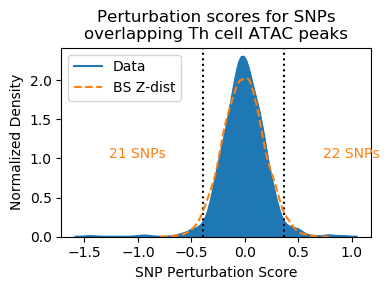

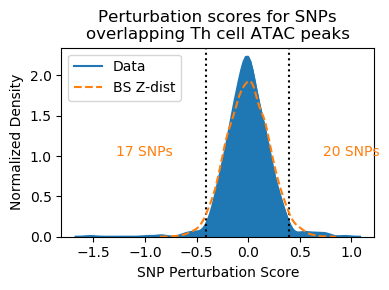

In [42]:
th17_lower, th17_upper = find_cutoffs(candidates_condensed.Th17_Std)
selected_snps_th17 = candidates_condensed.query('Th17_Std < {} | Th17_Std > {}'.format(th17_lower, th17_upper)).sort_values('Th17_Std')

th1_lower, th1_upper = find_cutoffs(candidates_condensed.Th1_Std)
selected_snps_th1 = candidates_condensed.query('Th1_Std < {} | Th1_Std > {}'.format(th1_lower, th1_upper)).sort_values('Th1_Std')

In [43]:
def readImpScores(filename):
    with open(filename) as f:
        lines = f.readlines()
        impscores = [
            np.array( [[float(z) for z in y.split(",")] for y in line.rstrip().split("\t")[2].split(";")])
            for line in lines
        ]
        seqnames = [
            np.array( [line.rstrip().split("\t")[0]])
            for line in lines
        ]
        ov_scores = [
            np.array( [line.rstrip().split("\t")[1]])
            for line in lines
        ]
    return seqnames, impscores
    

In [44]:
def impscores_to_df(condition):
    names_ref, imps_ref = readImpScores("snp_51bp_ref.fa.{}_idr3_500_t3_c10_g2_l10_k6.model.txt.impscores".format(condition))
    names_alt, imps_alt = readImpScores("snp_51bp_alt.fa.{}_idr3_500_t3_c10_g2_l10_k6.model.txt.impscore".format(condition))
    # Check that they are in the same order
    assert [str(x[0]).split("-")[0] for x in names_ref] == [str(x[0]).split("-")[0] for x in names_alt]
    names_trimmed = [str(x[0]).split("-")[0] for x in names_ref]
    # Build dict of impscores
    scores = {}

    for name, refscore, altscore in zip(names_trimmed, imps_ref, imps_alt):
        scores[name] = {"refscore" : refscore,
                       "altscore" : altscore}

    scores = pd.DataFrame().from_dict(scores, orient='index')
    
    return scores

In [45]:
scores_th17_std = impscores_to_df('Th17_Std')

In [46]:
scores_th1_std = impscores_to_df('Th1_Std')

In [47]:
selected_snps_th17 = selected_snps_th17.merge(scores_th17_std, left_index=True, right_index=True).rename(columns={'Th17_Std' : 'pert_score'})
selected_snps_th1 = selected_snps_th1.merge(scores_th1_std, left_index=True, right_index=True).rename(columns={'Th1_Std' : 'pert_score'})

In [49]:
selected_snps_th1.head()

,gene_symbol,Th17_Std,pert_score,refscore,altscore
rs17293632,SMAD3,-1.443240,-1.525070,"[[0.0, 0.0, 0.0, -0.00309644], [0.0, 0.0, 0.00...","[[0.0, 0.0, 0.0, -0.00350442], [0.0, 0.0, 0.00..."
rs9270925,H4C2|H4C2|H3C2|H3C2|H3C2|H2BC3|H2BC3|H2BC3|H2A...,-0.966708,-0.973607,"[[0.0, 0.0, 0.0047121, 0.0], [0.0, 0.0, 0.0, 0...","[[0.0, 0.0, 0.00460382, 0.0], [0.0, 0.0, 0.0, ..."
rs9270926,H2AC4|H2AC4|H2AC4|TNF|TNF|TNF|LTB|LTB|LTB|NCR3...,-0.912458,-0.845124,"[[0.00230265, 0.0, 0.0, 0.0], [0.00832253, 0.0...","[[0.00218073, 0.0, 0.0, 0.0], [0.0081349, 0.0,..."
rs11150589,ITGAL|AC116348.2,-0.479689,-0.840817,"[[0.000869635, 0.0, 0.0, 0.0], [0.0, 0.0, 0.00...","[[0.000746627, 0.0, 0.0, 0.0], [0.0, 0.0, 0.00..."
rs9271561,H2BC3|H2AC5P|H2BC3|H3C3|H3C3|H2AC5P|H2AC5P|H2A...,-0.290191,-0.627739,"[[0.0, 0.0, -0.0022702, 0.0], [0.0, -0.0017733...","[[0.0, 0.0, -0.00231972, 0.0], [0.0, -0.001852..."


In [50]:
def plot_impscores(selected, filename="fig.pdf"):
#     selected = selected_snps
    # selected = selected_snps_Tdown_allup.sort_values('corrected_pert_score', ascending=False)[:5]

    # # Build dict of impscores
    # scores = {}

    # for name, refscore, altscore in zip(names_trimmed, imps_ref, imps_alt):
    #     scores[name] = {"refscore" : refscore,
    #                    "altscore" : altscore}

    # Plot based on table

    f, axs = plt.subplots(len(selected) * 2, 1, figsize=(15, len(selected)*2*1.5), dpi=200, sharex=True)
    i = 0
    for ix, row in selected.iterrows():
        name = str(ix)
        ymin = min(np.min(row['refscore']), np.min(row['altscore']))*1.1
        ymax = max(np.max(row['refscore']), np.max(row['altscore']))*1.1
        axs[i].set_title(ix + "-ref ::" + ' :: '.join(str(x) for x in row[['pert_score', 'gene_symbol']]))
        viz_sequence.plot_weights_given_ax(ax = axs[i], array=row['refscore'])
        axs[i].axvline(x=26, ls="dotted", color="orange")
        axs[i].set_ylim(ymin, ymax)
        i += 1
        viz_sequence.plot_weights_given_ax(ax = axs[i], array=row['altscore'])
        axs[i].axvline(x=26, ls="dotted", color="orange")
        axs[i].set_ylim(ymin, ymax)
        i += 1

#     f.tight_layout()

    f.savefig(filename)

In [51]:
plot_impscores(selected_snps_th1, "th1_atac_linked_scores.pdf")

In [52]:
plot_impscores(selected_snps_th17, "th17_atac_linked_scores.pdf")

In [53]:
selected_unlinked = snp_51_per.loc[~snp_51_per.index.isin(candidates_condensed.index)]
selected_unlinked_th1 = selected_unlinked.merge(scores_th1_std, left_index=True, right_index=True).sort_values('Th1_Std', ascending=False)
selected_unlinked_th1 = selected_unlinked_th1.rename(columns={'Th1_Std' : 'pert_score'})

selected_unlinked_th17 = selected_unlinked.merge(scores_th1_std, left_index=True, right_index=True).sort_values('Th17_Std', ascending=False)
selected_unlinked_th17 = selected_unlinked_th1.rename(columns={'Th17_Std' : 'pert_score'})

/Users/josh/anaconda3/envs/py37/lib/python3.7/site-packages/pandas/core/series.py:1148: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


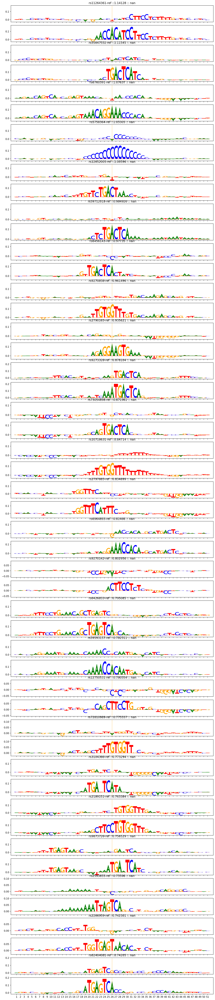

In [54]:
plot_impscores(selected_unlinked_th1.iloc[:25,:], "top_25_snp_perturbation_unlinked_th1.pdf")

/Users/josh/anaconda3/envs/py37/lib/python3.7/site-packages/pandas/core/series.py:1148: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


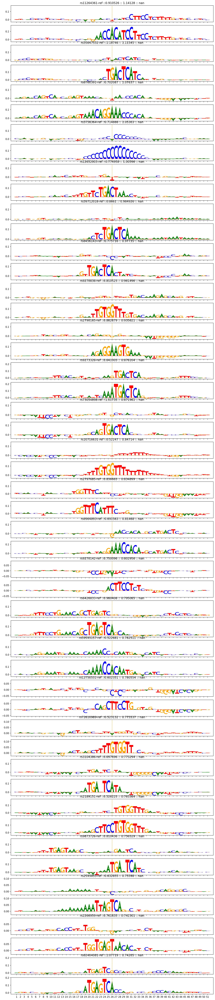

In [55]:
plot_impscores(selected_unlinked_th17.iloc[:25,:], "top_25_snp_perturbation_unlinked_th17.pdf")

In [110]:
def dirOfChange(row):
    difference = row['alt_perf_score'] = row['base_score']
    if row['ref_allele'] == row['minor_allele']:
        difference = difference * -1
    return np.sign(difference)
    

In [113]:
snp_51_per['T_cell'] = snp_51_per.index.isin(looping.name_snp)

In [114]:
def correctEffectDirection(row):
    if row.alt_allele == row.minor_allele:
        return row.alt_pert_score
    elif row.ref_allele == row.minor_allele:
        return row.alt_pert_score * -1
    else:
        return np.nan